In [4]:
import os 
os.chdir("/home/canyon/Bus-Weather-Impacts")
from src.utils import *
import pandas as pd
import os
import osmnx as ox
import numpy as np
import geopandas as gpd
import networkx as nx
from sklearn.neighbors import KDTree
import numpy as np
pd.options.mode.chained_assignment = None
pd.set_option('display.float_format', '{:.02f}'.format)
from geopy.distance import geodesic
from shapely.ops import linemerge
pd.set_option('display.float_format', lambda x: '%.6f' % x)
pd.set_option('display.max_columns', None)
import contextily as ctx
from src.api import parse_zipped_gtfs
import matplotlib.pyplot as plt
from src.gtfs_segments import GTFS_shape_processor
from plotnine import *
from shapely.geometry import LineString, Point

## Read MTA speed data

In [6]:
url = "https://data.ny.gov/resource/58t6-89vi.json"

# URL of the dataset (replace with actual dataset identifier)
# SoQL query parameters to get data for the date '2023-09-29'
params = {
    "$where": "Year >= 2023 AND Month == 10",
    "$limit": 1000000000,
}

response = requests.get(url, params=params)

# Check if the request was successful
if response.status_code == 200:
    mta_data = pd.DataFrame(response.json())
else:
    print("Error:", response.status_code)

In [7]:
mta_data.head(3)

,year,month,timestamp,day_of_week,hour_of_day,route_id,direction,borough,route_type,stop_order,timepoint_stop_id,timepoint_stop_name,timepoint_stop_latitude,timepoint_stop_longitude,next_timepoint_stop_id,next_timepoint_stop_name,next_timepoint_stop_latitude,next_timepoint_stop_longitude,road_distance,average_travel_time,average_road_speed,bus_trip_count,timepoint_stop_georeference,next_timepoint_stop_georeference
0,2023,10,2023-10-01T21:00:00.000,Thursday,21,B84,S,Brooklyn,Local,1,306921,LIVONIA AV/ASHFORD ST,40.666382,-73.883617,300590,COZINE AV /ASHFORD ST,40.658352,-73.877775,0.724,4.905558,8.855258115281435,3,"{'type': 'Point', 'coordinates': [-73.883617, ...","{'type': 'Point', 'coordinates': [-73.877775, ..."
1,2023,10,2023-10-01T09:00:00.000,Thursday,9,BXM1,N,Bronx,Express,13,404250,BROADWAY/W 207 ST,40.867685,-73.921405,984006,W 230 ST / BROADWAY,40.877199,-73.906891,1.0269999999999992,6.160428,10.002556641790129,8,"{'type': 'Point', 'coordinates': [-73.921405, ...","{'type': 'Point', 'coordinates': [-73.906891, ..."
2,2023,10,2023-10-01T14:00:00.000,Thursday,14,M11,S,Manhattan,Local,7,403447,W 135 ST/BROADWAY,40.819614,-73.954283,401459,AMSTERDAM AV/W 129 ST,40.814859,-73.95525,0.44100000000000006,4.905882,5.393525179856116,17,"{'type': 'Point', 'coordinates': [-73.954283, ...","{'type': 'Point', 'coordinates': [-73.95525, 4..."


## Read GTFS-realtime-performance speed data

In [8]:
gtfs_speed = read_speeds_between_dates("2023-10-01", "2023-10-31").query("speed_mph < 70 & speed_mph > 0")
full_trips = pd.read_parquet("/home/data/bus-weather/nyc_trip_shapes.parquet")
gtfs_speed = full_trips.merge(gtfs_speed)

In [9]:
gtfs_speed["hour_of_day"] = gtfs_speed["interpolated_time"].dt.hour
gtfs_speed["month"] = gtfs_speed["interpolated_time"].dt.month
gtfs_speed["year"] = gtfs_speed["interpolated_time"].dt.year
gtfs_speed["day_of_week"] = gtfs_speed["interpolated_time"].dt.day_name()
gtfs_speed["date"] = pd.to_datetime(gtfs_speed["interpolated_time"].dt.date)
gtfs_speed['combined_datetime'] = gtfs_speed['date'] + pd.to_timedelta(gtfs_speed['hour_of_day'], unit='h')
gtfs_speed = gtfs_speed.query("month == 10")

In [10]:
gtfs_speed.head(3)

,route_id,trip_id,shape_id,stop_sequence,stop_id,stop_name,prev_stop_id,prev_stop_name,projected_position,prev_projected_position,segment_length,interpolated_time,time_elapsed,speed_mph,unique_trip_id,hour_of_day,month,year,day_of_week,date,combined_datetime
0,B82+,EN_O3-Weekday-028500_SBS82_901,SBS821519,3,308865,PENNSYLVANIA AV/VANDALIA AV,304085,PENNSYLVANIA AV/SCHROEDERS AV,3549.285180,2239.943051,1309.342129,2023-10-02 10:19:32-04:00,139.000000,6.422540,EN_D3-Weekday-SDon-061400_SBS82_905MTA NYCT_76...,10,10,2023,Monday,2023-10-02,2023-10-02 10:00:00
1,B82+,EN_O3-Weekday-028500_SBS82_901,SBS821519,4,306950,FLATLANDS AV/LOUISIANA AV,308865,PENNSYLVANIA AV/VANDALIA AV,5701.373405,3549.285180,2152.088225,2023-10-02 10:21:09-04:00,97.000000,15.127139,EN_D3-Weekday-SDon-061400_SBS82_905MTA NYCT_76...,10,10,2023,Monday,2023-10-02,2023-10-02 10:00:00
2,B82+,EN_O3-Weekday-028500_SBS82_901,SBS821519,5,304092,FLATLANDS AV/E 105 ST,306950,FLATLANDS AV/LOUISIANA AV,7631.111210,5701.373405,1929.737805,2023-10-02 10:23:13-04:00,124.000000,10.610726,EN_D3-Weekday-SDon-061400_SBS82_905MTA NYCT_76...,10,10,2023,Monday,2023-10-02,2023-10-02 10:00:00


## Read segmented GTFS-static shapes and merge with NYC neighborhoods

In [11]:
segments = gpd.read_parquet("/home/data/bus-weather/bus_segments_2023_09_18.parquet")
ntas_url = "https://data.cityofnewyork.us/api/geospatial/d3qk-pfyz?method=export&format=GeoJSON"
ntas = gpd.read_file(ntas_url).to_crs(2263)
seg_ntas = segments.overlay(ntas)
seg_ntas["seg_length"] = seg_ntas.length
seg_ntas = seg_ntas.sort_values(["shape_id", "stop_id", "prev_stop_id", "seg_length"]).drop_duplicates(["shape_id", "stop_id", "prev_stop_id"], keep = "first")
seg_ntas = seg_ntas[["shape_id", "stop_id", "prev_stop_id", "boroname", "ntaname", "ntacode"]]
segments = segments.merge(seg_ntas, how = "left")
segments = segments.merge(gtfs_speed[["shape_id", "route_id"]].drop_duplicates())
gtfs_speed = gtfs_speed.merge(segments[["boroname", "ntaname", "shape_id", "stop_id", "prev_stop_id"]])

## Process MTA and GTFS-realtime-performance data into the same format

The MTA published speed similar to ours but with two key difference:

1.  The MTA's estimates are summarised to the day-of-week/month/hour level whereas ours are at the trip level
2.  The MTA data calculate speeds between 'major stops' (i.e., stops given a timepoint in the schedule) while ours contain speed estimates for every stop on a route

To compare the two sets of speeds, we recompute our speeds at the major stops and summarise to the same level as the MTA data.

In [12]:
mta_stops = mta_data[["route_id", "timepoint_stop_id", "next_timepoint_stop_id"]].drop_duplicates().rename({"timepoint_stop_id" : "prev_stop_id", "next_timepoint_stop_id" : "stop_id"}, axis = 1)
mta_stops["prev_stop_id"] = mta_stops["prev_stop_id"].astype(int)
mta_stops["stop_id"] = mta_stops["stop_id"].astype(int)
major_stops = pd.concat([mta_stops["prev_stop_id"], mta_stops["stop_id"]]).drop_duplicates().to_list()

In [13]:
gtfs_major_stops = gtfs_speed[["route_id", "shape_id", "unique_trip_id", "stop_id", "projected_position", "interpolated_time", "date", "day_of_week", "hour_of_day", "month", "combined_datetime", "boroname", "ntaname"]].query("stop_id.isin(@major_stops)").drop_duplicates().sort_values(["unique_trip_id", "interpolated_time"])
gtfs_major_stops["prev_stop_id"] =  gtfs_major_stops.groupby("unique_trip_id")["stop_id"].shift(1)
gtfs_major_stops["distance_traveled"] =  gtfs_major_stops.groupby("unique_trip_id")["projected_position"].diff()
gtfs_major_stops["time_elapsed"] =  gtfs_major_stops.groupby("unique_trip_id")["interpolated_time"].diff().dt.total_seconds()
gtfs_major_stops = gtfs_major_stops.dropna()
gtfs_major_stops["prev_stop_id"] = gtfs_major_stops["prev_stop_id"].astype(int)

In [14]:
gtfs_major_stops = gtfs_major_stops.dropna()
gtfs_major_stops["speed_mph"] = (gtfs_major_stops["distance_traveled"]) / gtfs_major_stops["time_elapsed"] * 0.681818
gtfs_major_stops = gtfs_major_stops.query("speed_mph < 60")

In [15]:
hourly_speeds_gtfs = gtfs_major_stops.groupby(["route_id", "hour_of_day", "day_of_week", "stop_id", "prev_stop_id", "boroname", "ntaname"]).agg(average_road_speed = ("speed_mph", "mean"),
                                                                                                                                    bus_trip_count = ("unique_trip_id", "nunique")).reset_index().rename({"stop_id" : "next_timepoint_stop_id",
                                                                                                                                                                                                          "prev_stop_id": "timepoint_stop_id",
                                                                                                                                                                                                          "prev_stop_name" : "timepoint_stop_name",
                                                                                                                                                                                                          "stop_name" : "next_timepoint_stop_name"}, axis = 1)
hourly_speeds_gtfs["source"] = "GTFS"

In [16]:
hourly_speeds_mta = mta_data[["route_id", "month", "hour_of_day", "day_of_week", "timepoint_stop_id", "next_timepoint_stop_id", "average_road_speed", "bus_trip_count"]]
hourly_speeds_mta["source"] = "MTA"
hourly_speeds_mta["average_road_speed"] = hourly_speeds_mta["average_road_speed"].astype(float)

In [17]:
hourly_speeds_mta["hour_of_day"] = hourly_speeds_mta["hour_of_day"].astype(int)
hourly_speeds_mta["timepoint_stop_id"] = hourly_speeds_mta["timepoint_stop_id"].astype(int)
hourly_speeds_mta["next_timepoint_stop_id"] = hourly_speeds_mta["next_timepoint_stop_id"].astype(int)

In [18]:
merged_speeds = hourly_speeds_gtfs.rename({"average_road_speed" : "average_speed_gtfs", "bus_trip_count" : "bus_trip_count_gtfs"}, axis = 1).drop("source", axis = 1).merge(hourly_speeds_mta)

## Speed Validation

Here we compare our speed estimates to the estimates provided by the MTA. Overall we find the two are very similar - the correlation is 0.87 and the distributions and hourly averages look nearly identical.

In [19]:
merged_speeds[["average_speed_gtfs", "average_road_speed"]].describe()

,average_speed_gtfs,average_road_speed
count,272976.000000,272976.000000
mean,8.792165,8.775528
std,4.372016,4.020863
min,0.045320,0.215750
25%,5.995776,6.125230
50%,7.891534,7.920532
75%,10.465114,10.374431
max,59.962150,39.999591


In [24]:
merged_speeds[["average_speed_gtfs", "average_road_speed"]].corr()

,average_speed_gtfs,average_road_speed
average_speed_gtfs,1.000000,0.874822
average_road_speed,0.874822,1.000000


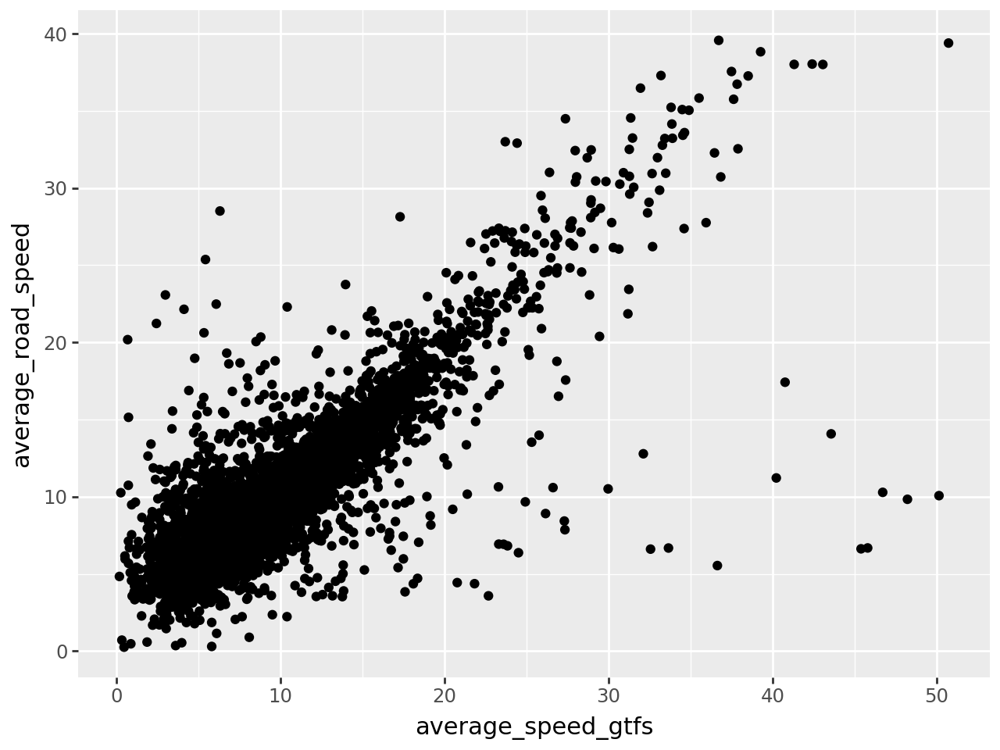

In [20]:
(ggplot(merged_speeds.sample(10000), aes(x = "average_speed_gtfs", y = "average_road_speed")) + geom_point())

/home/canyon/.local/share/virtualenvs/TOP-Sprint-lAvM2-mU/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 151 rows containing non-finite values.


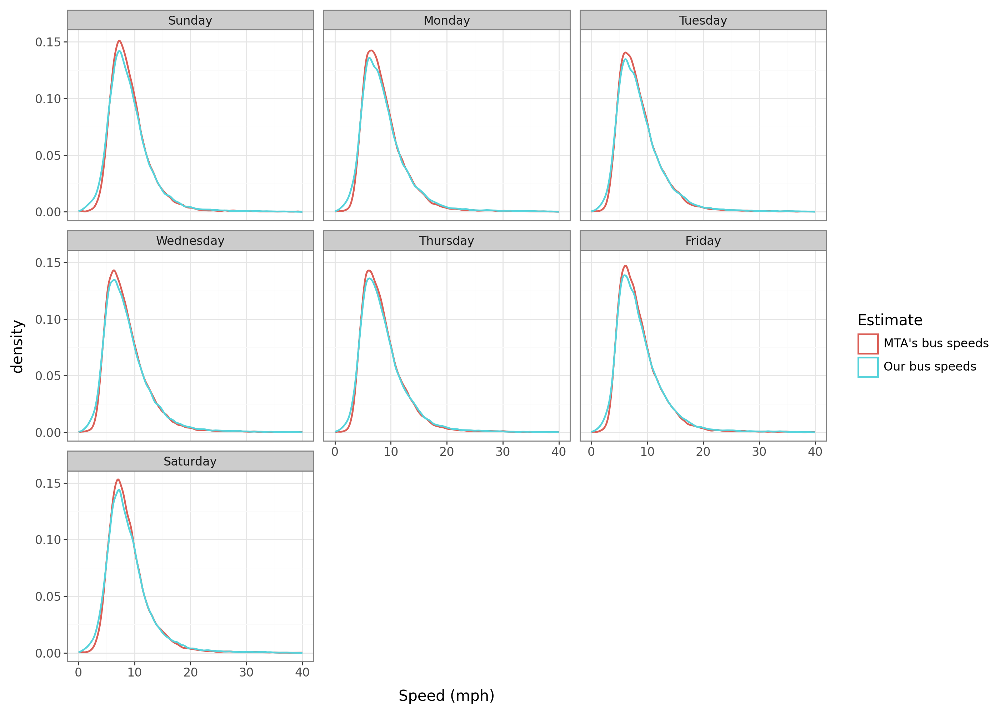

In [21]:
merged_speeds["day_of_week"] = pd.Categorical(merged_speeds["day_of_week"], ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], ordered=True)
plot_dat = merged_speeds.melt(id_vars = "day_of_week", value_vars= ["average_road_speed", "average_speed_gtfs"])
(ggplot(plot_dat, aes(x = "value", color = "variable")) + geom_density(size = 1) + facet_wrap("~day_of_week") + theme_bw(base_size = 15) + theme(figure_size= (14, 10)) + scale_color_discrete(name = "Estimate", labels = ["MTA's bus speeds", "Our bus speeds"]) + xlim(0, 40) + labs(x = "Speed (mph)")) 

/tmp/ipykernel_19130/2788512855.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


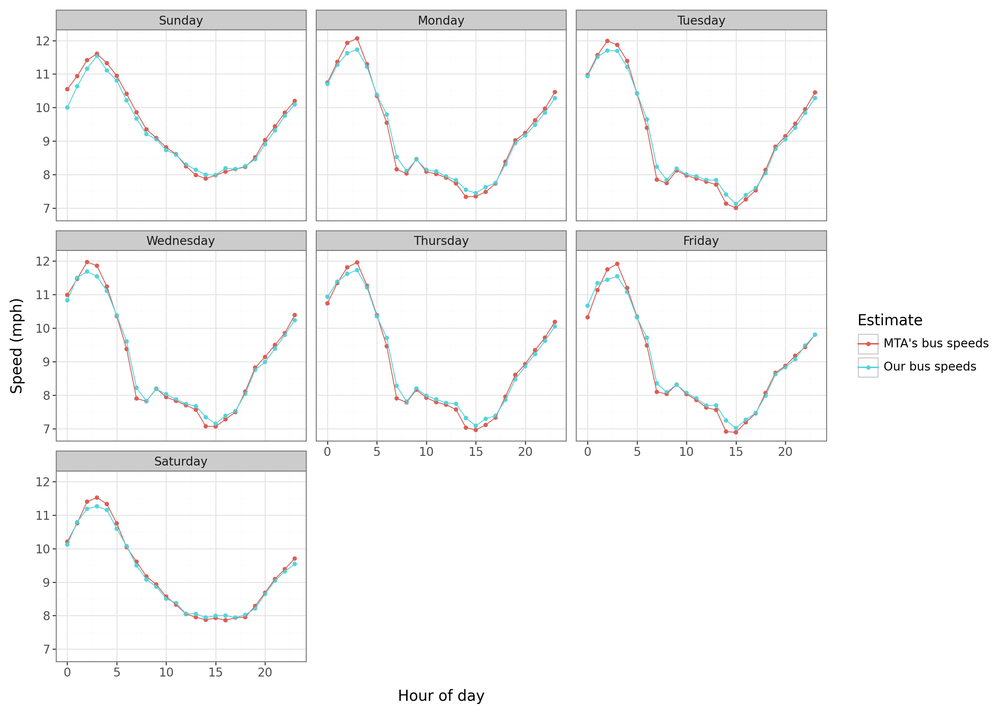

In [22]:
plot_dat = merged_speeds.melt(id_vars = ["day_of_week", "hour_of_day"], value_vars= ["average_road_speed", "average_speed_gtfs"])
plot_dat = plot_dat.groupby(["day_of_week", "hour_of_day", "variable"])["value"].mean().reset_index()
(ggplot(plot_dat, aes(x = "hour_of_day", color = "variable", y = "value", group = "variable")) + geom_point() + geom_line() + facet_wrap("~day_of_week") + theme_bw(base_size = 15) + theme(figure_size= (14, 10)) + scale_color_discrete(name = "Estimate", labels = ["MTA's bus speeds", "Our bus speeds"]) + labs(x = "Hour of day", y = "Speed (mph)")) 

## This section of the notebook contains basic results examining speeds by borough and the fastest and slowest routes in Brooklyn

/home/canyon/.local/share/virtualenvs/TOP-Sprint-lAvM2-mU/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_boxplot : Removed 513 rows containing non-finite values.


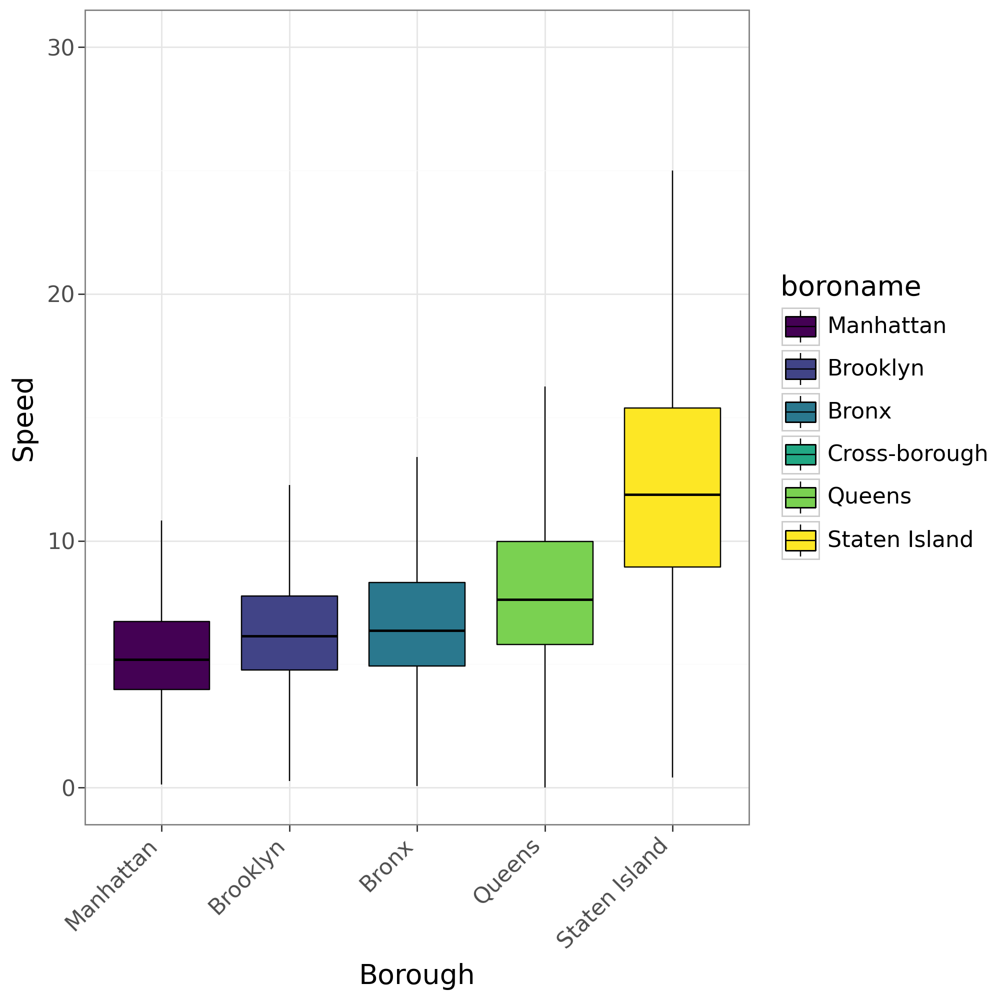

In [25]:
plot_dat = gtfs_major_stops.query("hour_of_day > 7 & hour_of_day < 20 & ~day_of_week.isin(['Saturday', 'Sunday'])").sample(100000)
borough_order = ["Manhattan", "Brooklyn", "Bronx",  "Cross-borough", "Queens", "Staten Island"]
plot_dat["boroname"] = pd.Categorical(plot_dat["boroname"], categories=borough_order, ordered=True)
plot_dat = plot_dat.dropna(subset="boroname")

(ggplot(plot_dat, aes(x = "boroname", y = "speed_mph", fill = "boroname")) +  geom_boxplot(outlier_shape='',  color = "black")  + 
  ylim(0, 30) +  theme_bw(base_size = 20) + theme(figure_size = (10, 10), axis_text_x=element_text(rotation=45, hjust=1)) + labs(x = "Borough", y = "Speed"))

In [26]:
bk_gtfs_dict = parse_zipped_gtfs("https://transitfeeds.com/p/mta/80/20230918/download")
bk_routes = bk_gtfs_dict["shapes.txt"].merge(bk_gtfs_dict["trips.txt"]).query("route_id.str.startswith('B')")
bk_list = bk_routes.route_id.drop_duplicates().to_list()

In [27]:
full_bk_speeds = gtfs_major_stops.query("hour_of_day > 7 & hour_of_day < 20 & ~day_of_week.isin(['Saturday', 'Sunday']) & route_id.isin(@bk_list)").sample(100000).groupby("route_id")["speed_mph"].mean().reset_index().sort_values("speed_mph")
top_and_bottom = pd.concat([full_bk_speeds.head(5), full_bk_speeds.tail(5)])
top_and_bottom

,route_id,speed_mph
38,B63,4.886532
32,B54,4.952319
2,B12,5.123234
16,B35,5.243719
11,B25,5.270780
14,B31,7.943334
49,B82+,8.159945
24,B44+,8.371394
51,B84,8.711401
46,B74,10.149425


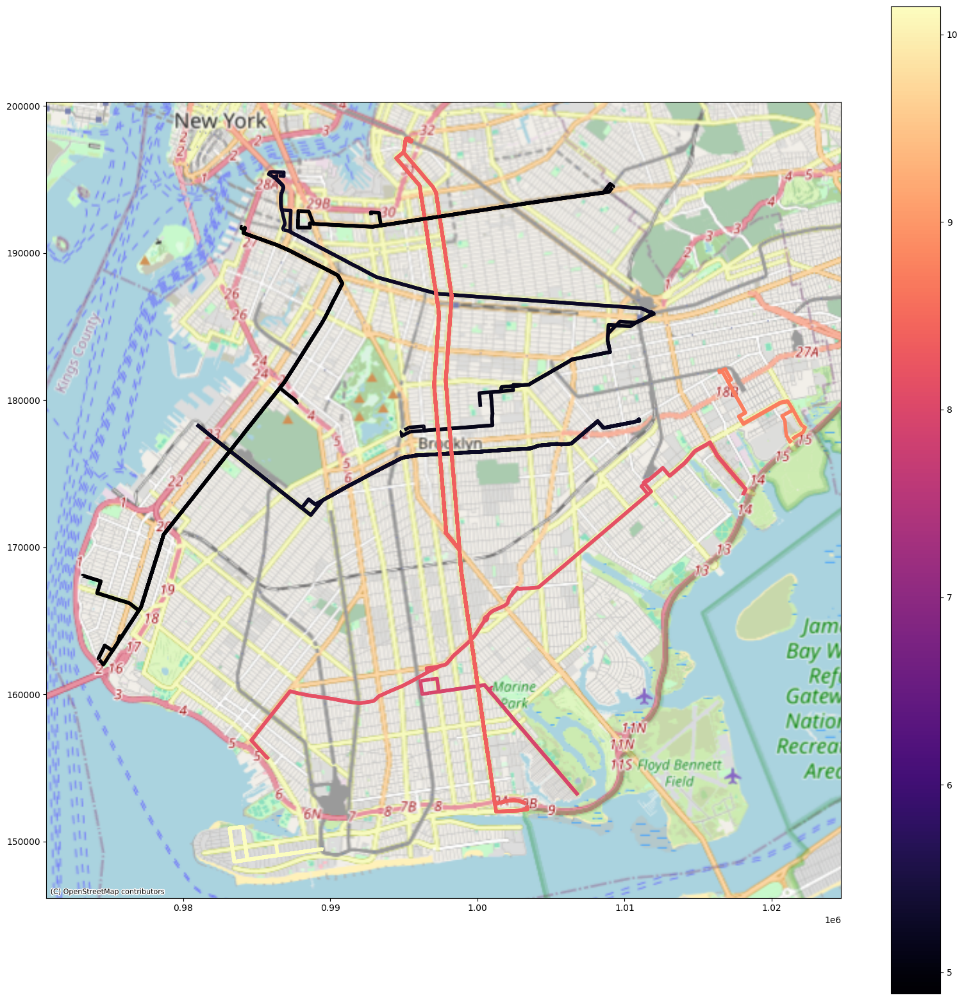

In [28]:
fig, ax = plt.subplots(figsize=(20, 20)) 
segments.merge(top_and_bottom).plot(ax = ax, column = "speed_mph", legend = True, linewidth = 4, cmap = "magma")
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=ntas.crs)
plt.show()

## This final section produces some maps outlining the segmentation and speed calculation process

In [30]:
manhattan_gtfs_dict = parse_zipped_gtfs("https://transitfeeds.com/p/mta/82/20230919/download")

In [31]:
stops = manhattan_gtfs_dict['stops.txt']
trips = manhattan_gtfs_dict['trips.txt']
stop_times = manhattan_gtfs_dict['stop_times.txt']
merged_stops = stop_times.merge(trips).drop_duplicates(["stop_id", "shape_id"]).merge(stops)
merged_stops['geometry'] = merged_stops.apply(lambda row: Point(row['stop_lon'], row['stop_lat']), axis=1)
merged_stops = gpd.GeoDataFrame(merged_stops, geometry='geometry', crs = 4326).to_crs(2263)

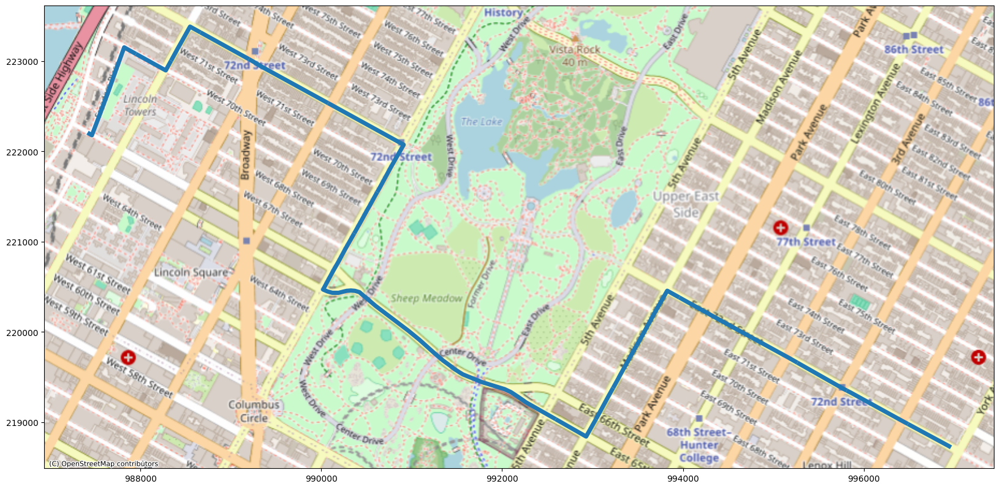

In [32]:
segments_m72 = segments.query("shape_id == 'M720002'")

fig, ax = plt.subplots(figsize=(20, 20)) 
segments_m72.plot(ax=ax, linewidth = 5)
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=ntas.crs)
plt.show()

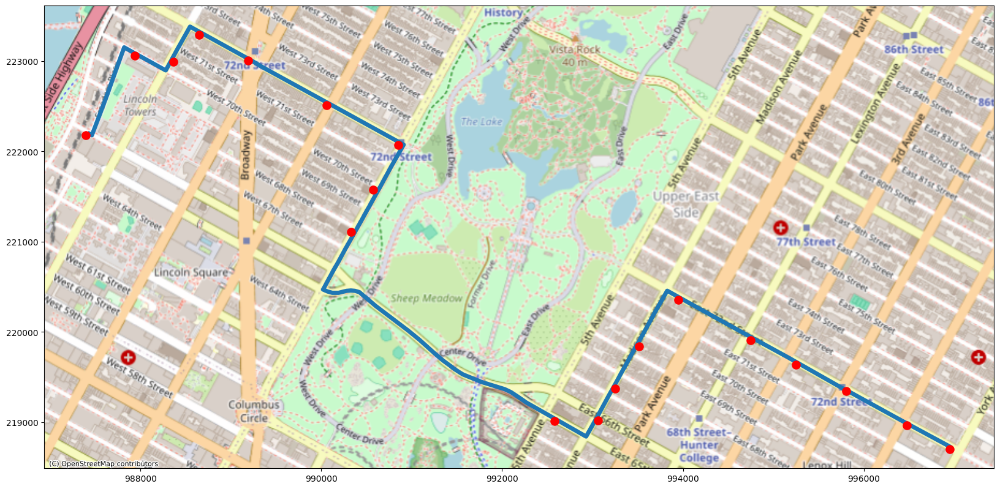

In [33]:
segments_m72 = segments.query("shape_id == 'M720002'")

fig, ax = plt.subplots(figsize=(20, 20)) 

segments_m72.plot(ax=ax, linewidth = 5)
# Add a basemap from contextily
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=ntas.crs)
merged_stops.query("shape_id == 'M720002'").plot(ax = ax, markersize = 90, color = "red", zorder = 100)
# Show the plot
plt.show()

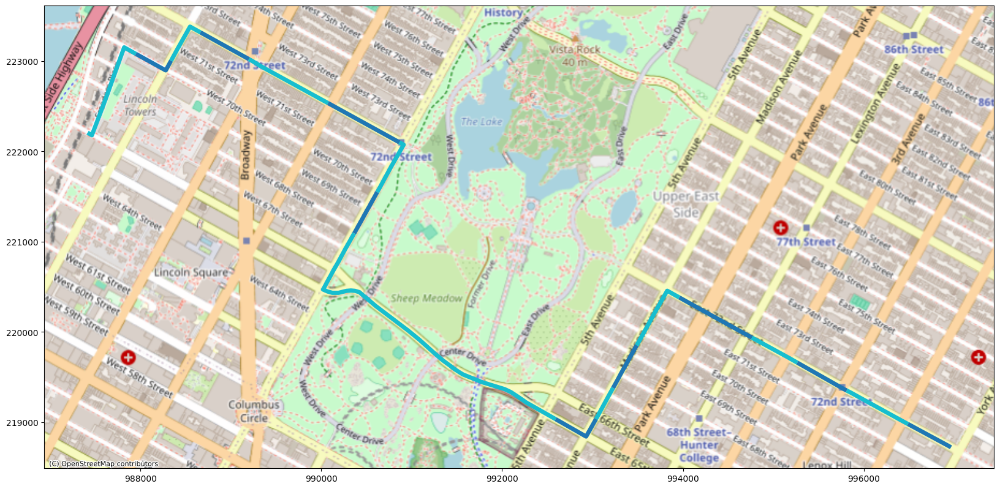

In [34]:

# Filter segments for a specific shape_id
segments_m72 = segments.query("shape_id == 'M720002'")
segments_m72["parity"] = segments_m72["stop_sequence"].apply(lambda x: 'red' if x % 2 == 0 else 'blue')
fig, ax = plt.subplots(figsize=(20, 20))
segments_m72.plot(ax=ax, linewidth=5, column='parity')
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=segments_m72.crs)

plt.show()

In [39]:
m72_speeds = gtfs_speed.query("shape_id == 'M720002' & hour_of_day >= 8 & hour_of_day < 20").groupby(["stop_id", "prev_stop_id"])["speed_mph"].mean().reset_index()

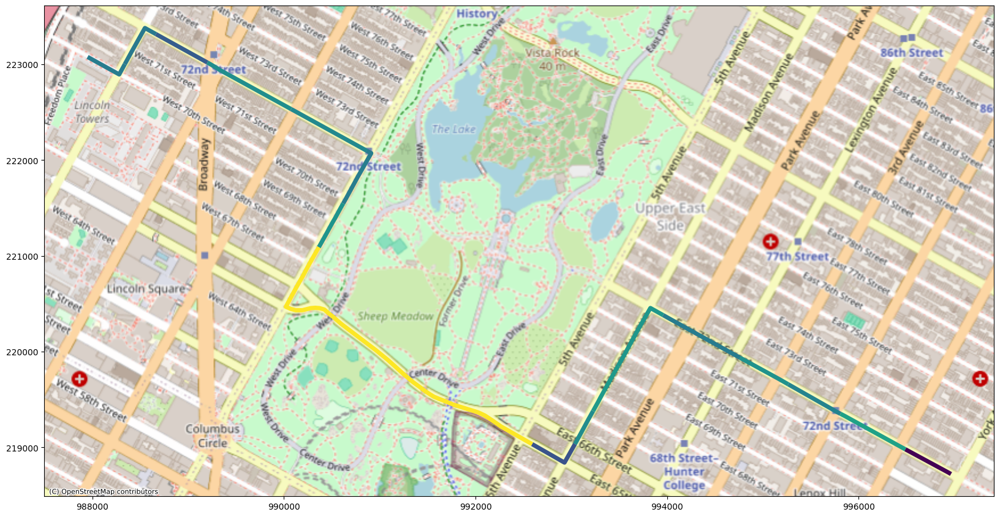

In [36]:
fig, ax = plt.subplots(figsize=(20, 20))
segments_m72.merge(m72_speeds).plot(ax=ax, linewidth=5, column='speed_mph')
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=segments_m72.crs)
plt.show()

In [37]:
GTFS_PATH = "https://urbantech-public.s3.amazonaws.com/DO-NOT-DELETE-BUSOBSERVATORY-PUBLIC-DATASET/one-system-day.tar.gz"
NYC_gtfs_rt = read_parquet_from_tar_gz(GTFS_PATH)
NYC_gtfs_rt = gpd.GeoDataFrame(
        NYC_gtfs_rt, 
        geometry=gpd.points_from_xy(NYC_gtfs_rt.lon, NYC_gtfs_rt.lat), 
        crs="EPSG:4326"
    )

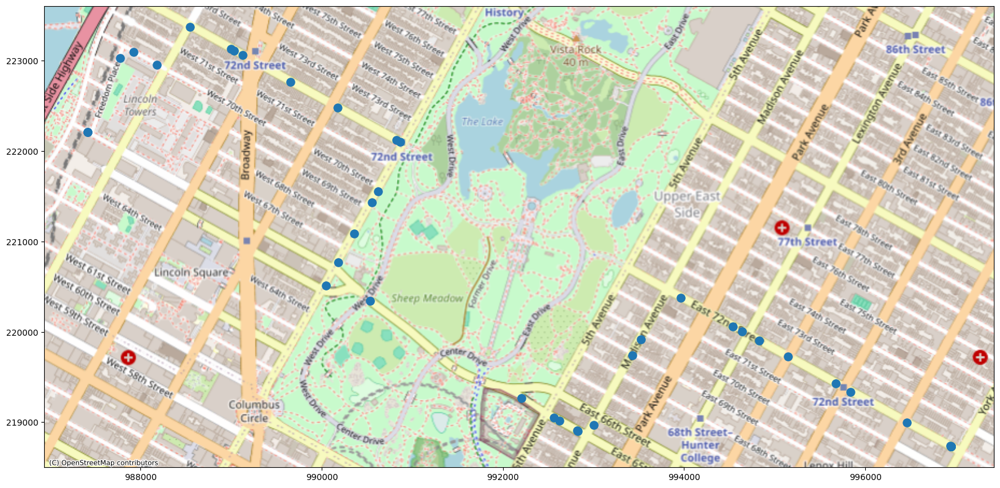

In [38]:
fig, ax = plt.subplots(figsize=(20, 20))
NYC_gtfs_rt.to_crs(2263).query("route == 'M72' & trip_id == 'MTA NYCT_MQ_C3-Weekday-SDon-058400_M72_601'").plot(ax = ax, markersize = 90)
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=segments_m72.crs)
plt.show()